In [1]:
import cv2
import matplotlib.pyplot as plt
import glob
import numpy as np
from skimage.feature import greycomatrix, greycoprops, canny, corner_harris, SIFT
from sklearn.model_selection import train_test_split

ImportError: cannot import name 'SIFT' from 'skimage.feature' (D:\Anaconda3\lib\site-packages\skimage\feature\__init__.py)

In [30]:
img = cv2.imread('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/1/0001.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
sift = skimage.feature.SIFT
show_images([descs_img])

AttributeError: module 'skimage.feature' has no attribute 'SIFT'

In [16]:
def show_images(images, titles=None):
    # This function is used to show image(s) with titles by sending an array of images and an array of associated titles.
    # images[0] will be drawn with the title titles[0] if exists
    # You aren't required to understand this function, use it as-is.
    n_ims = len(images)
    if titles is None:
        titles = ['(%d)' % i for i in range(1, n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image, title in zip(images, titles):
        a = fig.add_subplot(1, n_ims, n)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show()

In [79]:
def glcmFeaturesExtraction(xTrain):
    trainingFeatures = np.zeros((len(xTrain), 16))
    for i in range(len(xTrain)):
        glcm1 = greycomatrix(xTrain[i], [1], [0])
        energy1 = greycoprops(glcm1, prop='energy')
        homogeneity1 = greycoprops(glcm1, prop='homogeneity')
        correlation1 = greycoprops(glcm1, prop='correlation')
        dissimilarity1 = greycoprops(glcm1, prop='dissimilarity')
        glcm2 = greycomatrix(xTrain[i], [1], [np.pi / 2])
        energy2 = greycoprops(glcm2, prop='energy')
        homogeneity2 = greycoprops(glcm2, prop='homogeneity')
        correlation2 = greycoprops(glcm2, prop='correlation')
        dissimilarity2 = greycoprops(glcm2, prop='dissimilarity')
        glcm3 = greycomatrix(xTrain[i], [1], [np.pi])
        energy3 = greycoprops(glcm3, prop='energy')
        homogeneity3 = greycoprops(glcm3, prop='homogeneity')
        correlation3 = greycoprops(glcm3, prop='correlation')
        dissimilarity3 = greycoprops(glcm3, prop='dissimilarity')
        glcm4 = greycomatrix(xTrain[i], [1], [(3 * np.pi) / 2])
        energy4 = greycoprops(glcm4, prop='energy')
        homogeneity4 = greycoprops(glcm4, prop='homogeneity')
        correlation4 = greycoprops(glcm4, prop='correlation')
        dissimilarity4 = greycoprops(glcm4, prop='dissimilarity')
        trainingFeatures[i] = np.resize(np.asarray([energy1, homogeneity1, correlation1, dissimilarity1, energy2, homogeneity2, correlation2, dissimilarity2, energy3, homogeneity3, correlation3, dissimilarity3, energy4, homogeneity4, correlation4, dissimilarity4]), 16)
    return trainingFeatures

In [32]:
def featuresExtraction(example):
    edges = canny(example, sigma=2)
    edgesRatio = np.sum(edges == 1) / (example.shape[0] * example.shape[1])
    corners = corner_harris(example)
    cornersRatio = np.sum(corners > 0) / (example.shape[0] * example.shape[1])
    binary = np.copy(example)
    binary[binary < 150] = 0
    binary[binary >= 150] = 1
    verticalHistAvg = np.mean(np.sum(binary, axis = 0))
    HorizontalHistAvg = np.mean(np.sum(binary, axis = 1))
    featureVector = [edgesRatio, cornersRatio, verticalHistAvg, HorizontalHistAvg]
    return featureVector

In [21]:
def preprocess(img):
    img = np.asarray(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return img

In [22]:
def readData():
    xData = []
    yData = []
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/1/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(1)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/2/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(2)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/3/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(3)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/4/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(4)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/5/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(5)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/6/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(6)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/7/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(7)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/8/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(8)
    for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/9/*.jpg')):
        img = cv2.imread(filename)
        img = preprocess(img)
        xData.append(img)
        yData.append(9)
    xTrain, xTest, yTrain, yTest = train_test_split(np.asarray(xData), np.asarray(yData), test_size = 0.2, shuffle = True)
    return xTrain, xTest, yTrain, yTest

In [23]:
def modelTrain(xTrain):
    trainingFeatures = np.zeros((len(xTrain), 4))
    for i in range(len(xTrain)):
        featureVector = featuresExtraction(xTrain[i])
        trainingFeatures[i] = np.resize(np.asarray(featureVector), 4)
    return trainingFeatures

In [35]:
xTrain, xTest, yTrain, yTest = readData()
trainingFeatures = modelTrain(xTrain)
print(trainingFeatures)

[[3.20023488e-02 3.73230247e-01 1.21222222e+02 2.16534351e+02]
 [4.76200821e-02 1.53755078e-01 1.04164921e+02 1.65107884e+02]
 [9.89956958e-02 5.47425474e-01 4.57967480e+01 2.20901961e+02]
 ...
 [8.75742888e-02 7.09061797e-01 9.75455975e+01 5.69165138e+02]
 [6.50766242e-02 6.63896683e-01 1.40005900e+02 2.89402439e+02]
 [7.39361702e-02 1.83926197e-01 6.15595745e+01 2.26039062e+02]]


In [24]:
def calculateDistance(x1, x2):
    distance = np.linalg.norm(x1 - x2)
    return distance

In [25]:
def MinimumDistanceClassifier(testPoint, trainingFeatures, yTrain):
    distances = list()
    centers = [np.mean(trainingFeatures[yTrain == 1], axis=0), np.mean(trainingFeatures[yTrain == 2], axis=0), np.mean(trainingFeatures[yTrain == 3], axis=0), np.mean(trainingFeatures[yTrain == 4], axis=0), np.mean(trainingFeatures[yTrain == 5], axis=0), np.mean(trainingFeatures[yTrain == 6], axis=0), np.mean(trainingFeatures[yTrain == 7], axis=0), np.mean(trainingFeatures[yTrain == 8], axis=0), np.mean(trainingFeatures[yTrain == 9], axis=0)]
    for i in range(len(centers)):
        distances.append(calculateDistance(testPoint, centers[i]))
    classification = np.argmin(distances)
    return classification

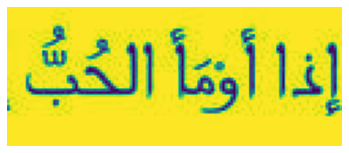

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 5


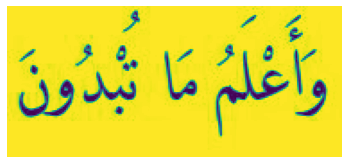

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 8


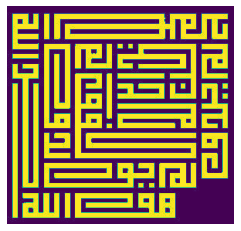

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


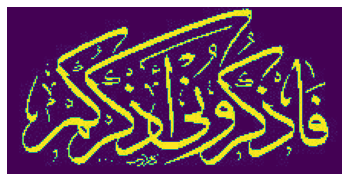

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


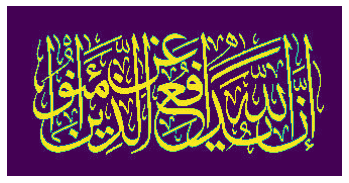

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


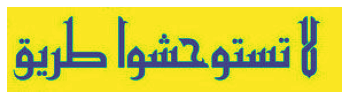

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 3


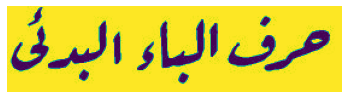

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 3


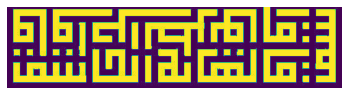

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 3


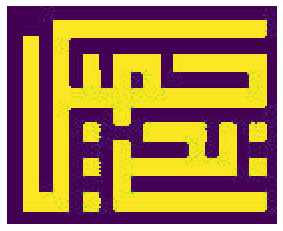

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


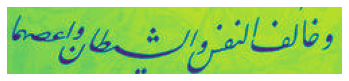

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 8


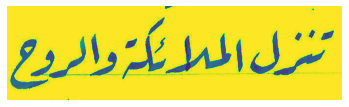

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 1


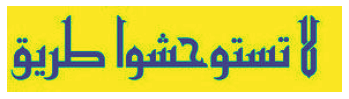

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 3


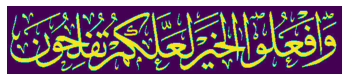

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 8


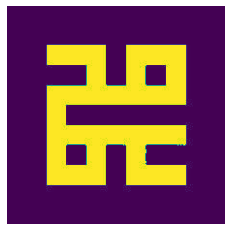

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


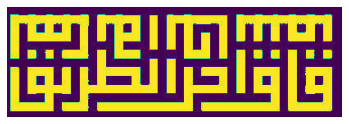

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 8


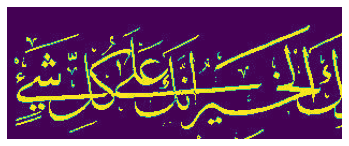

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


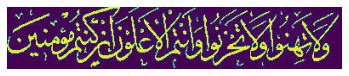

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


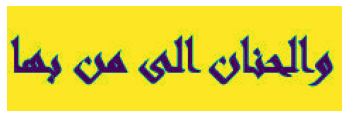

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 2


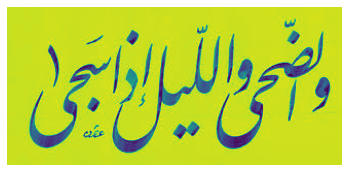

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 6


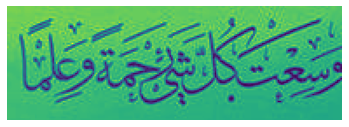

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


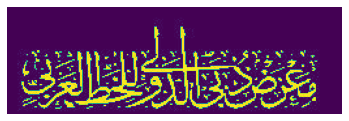

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


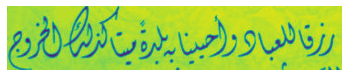

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


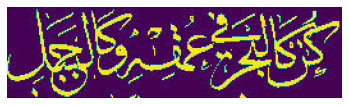

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


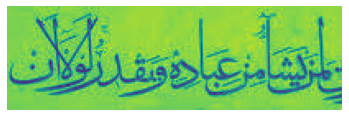

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 8


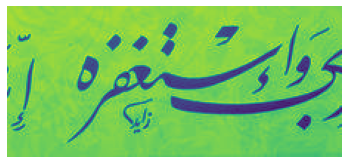

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


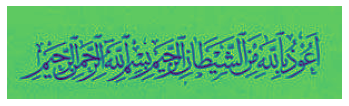

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 2


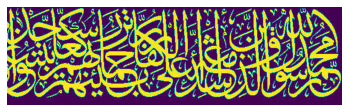

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 3


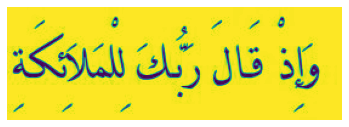

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 3


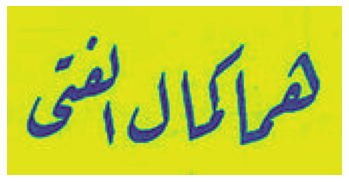

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 9


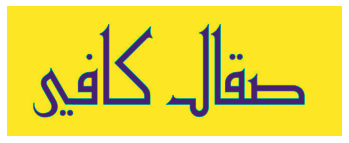

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 1


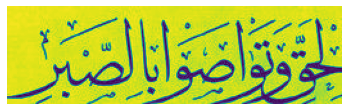

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 2


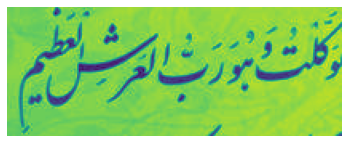

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


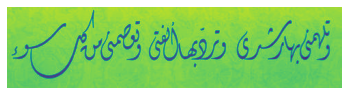

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


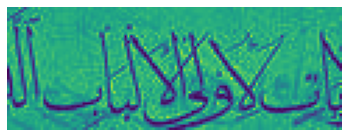

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


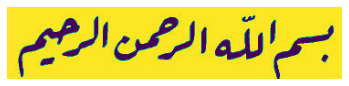

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 6


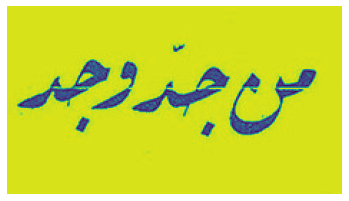

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 2


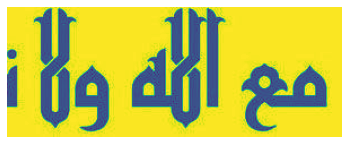

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 2


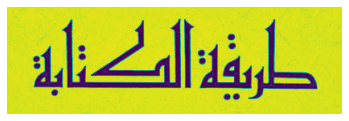

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 1


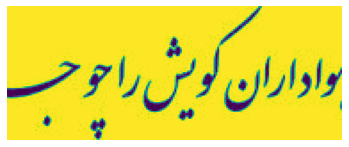

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 8


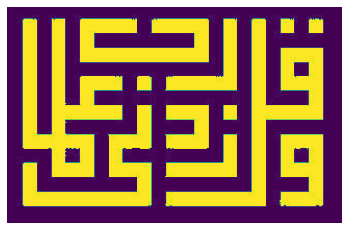

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


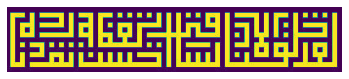

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 8


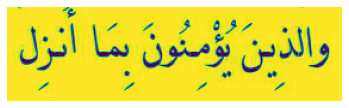

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 7


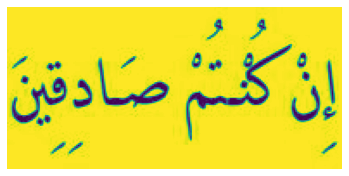

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


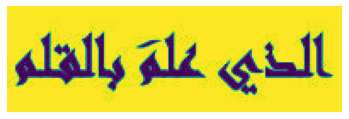

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


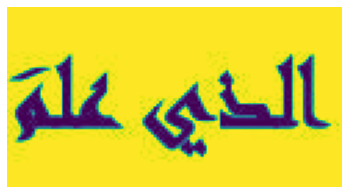

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 5


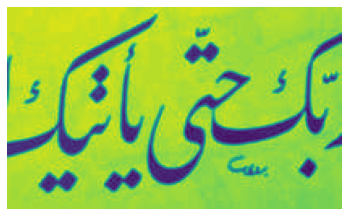

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


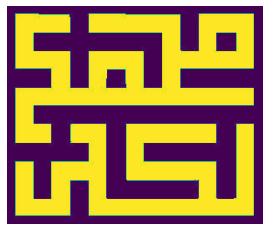

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


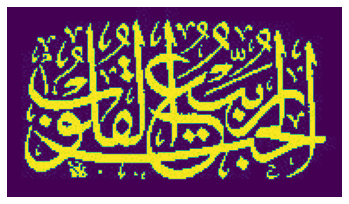

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


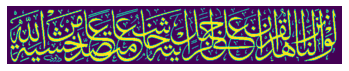

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 7


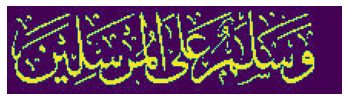

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


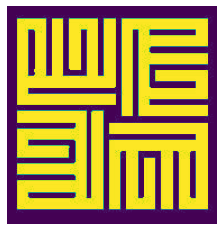

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


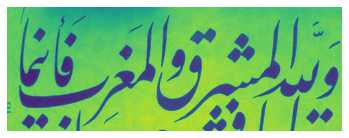

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


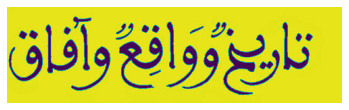

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


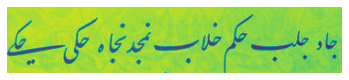

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


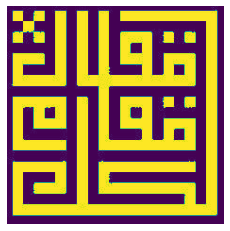

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


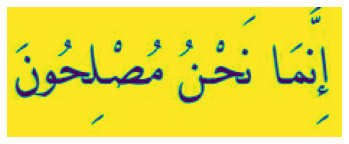

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


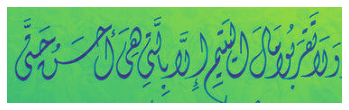

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


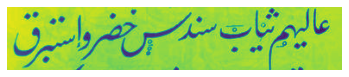

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


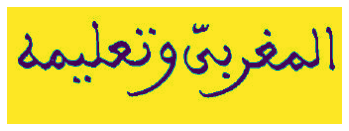

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 6


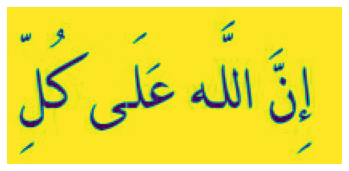

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


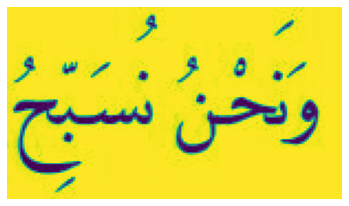

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


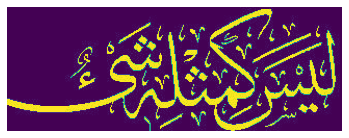

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


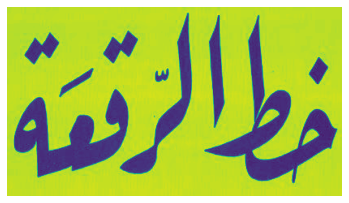

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 6


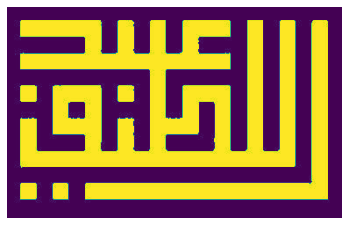

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


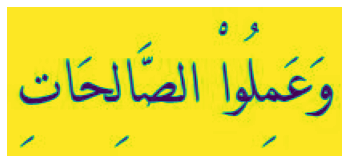

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


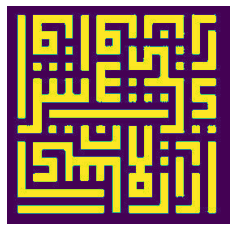

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


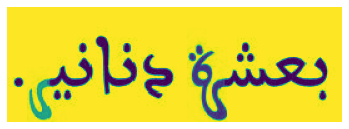

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 3


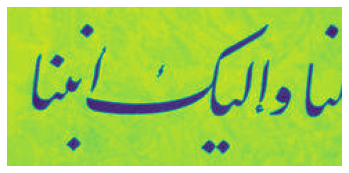

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


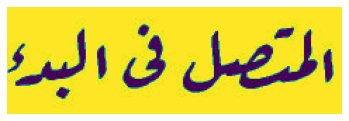

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 2


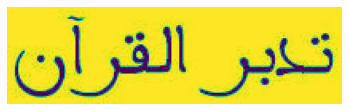

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 8


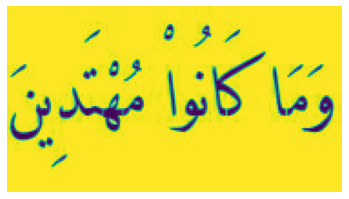

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


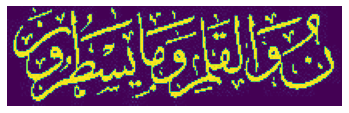

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


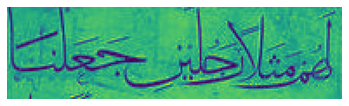

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


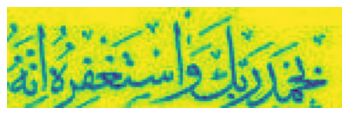

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


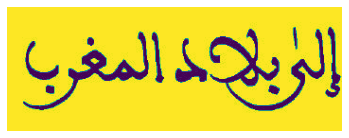

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 6


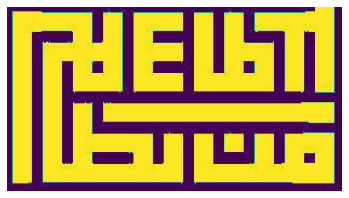

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 2


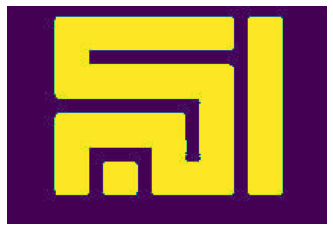

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


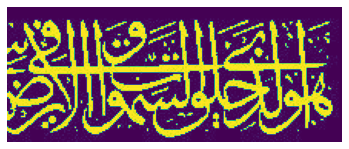

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


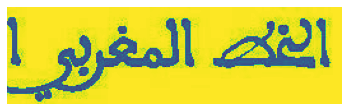

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 2


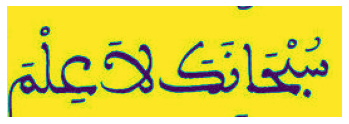

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 3


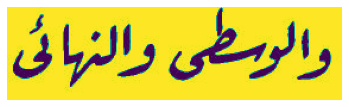

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 3


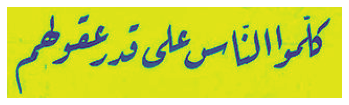

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 7


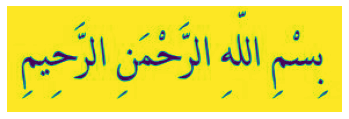

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 4


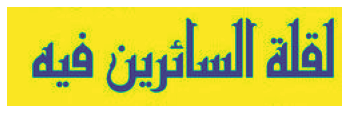

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 2


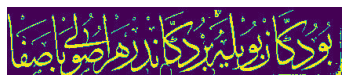

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


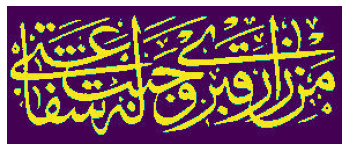

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


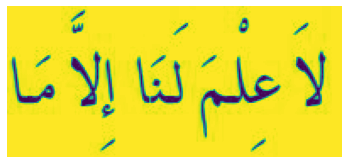

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


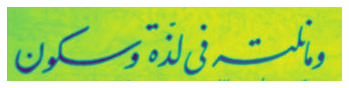

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


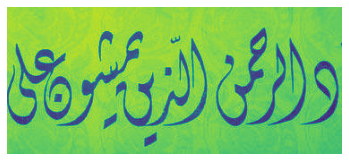

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


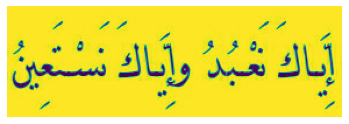

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 4


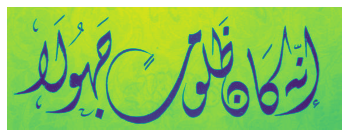

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


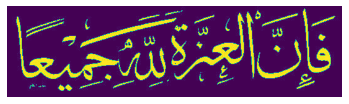

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


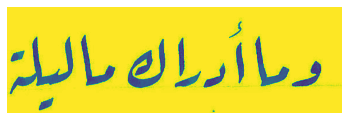

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 1


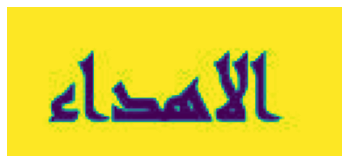

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 5


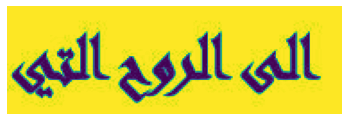

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


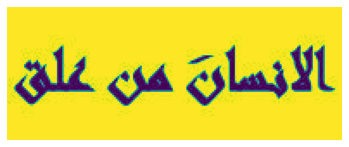

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


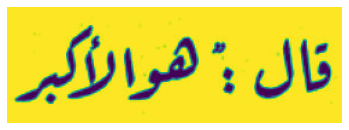

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 3


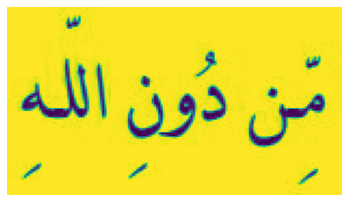

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


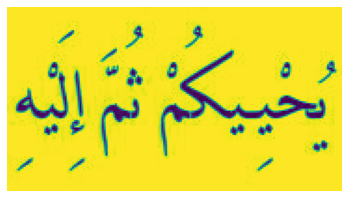

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


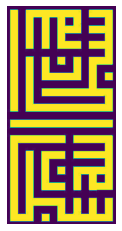

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


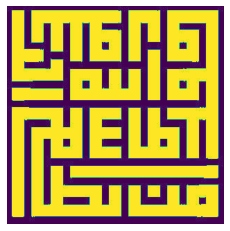

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 2


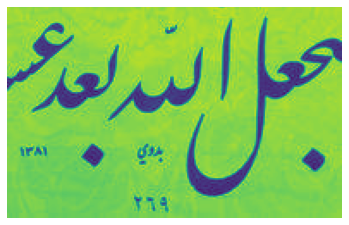

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 9


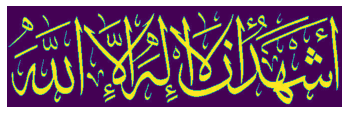

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 8


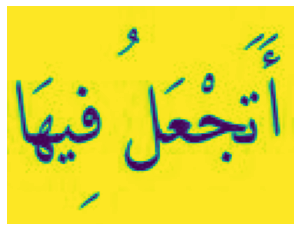

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


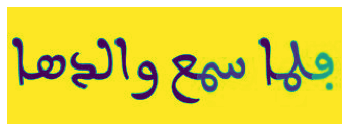

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 4


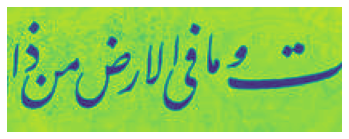

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


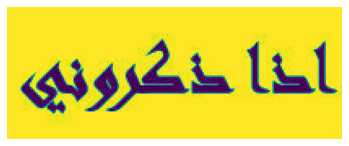

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


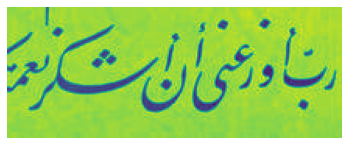

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


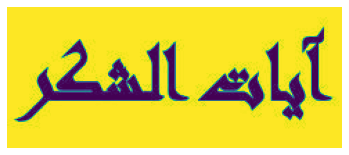

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 2


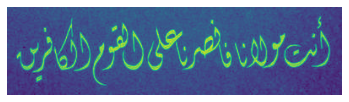

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 5


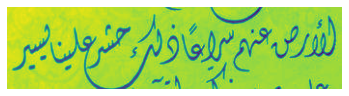

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


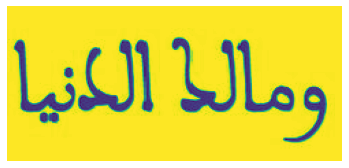

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 2


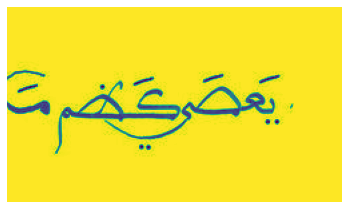

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 3


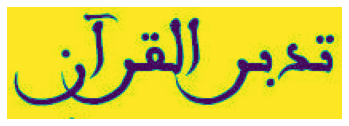

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 8


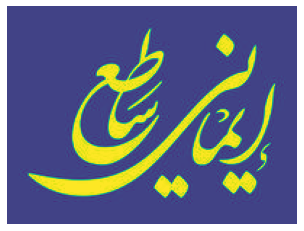

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 5


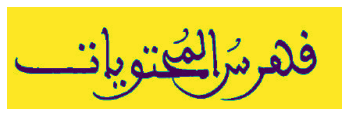

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


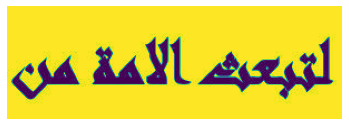

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 3


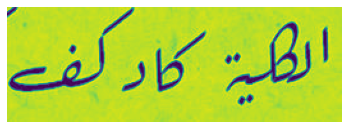

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 3


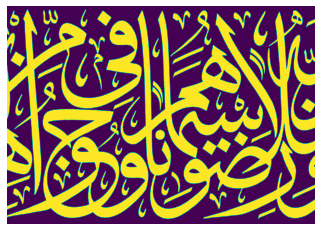

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 1


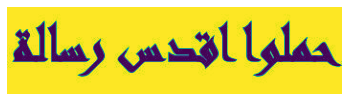

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 7


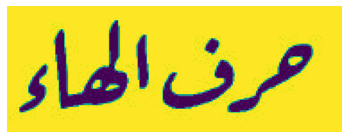

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 8


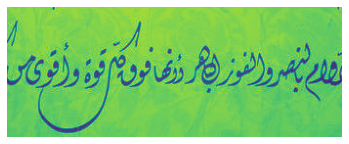

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


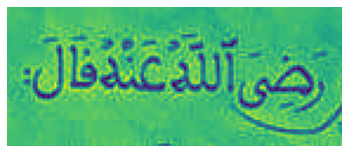

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 5


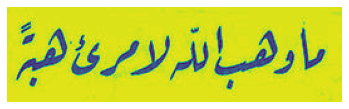

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 3


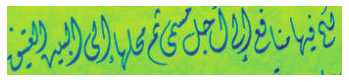

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 7


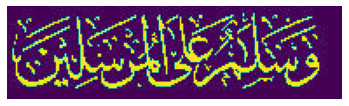

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


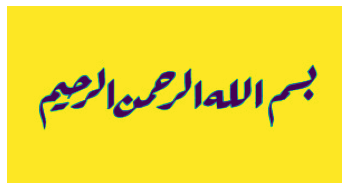

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 4


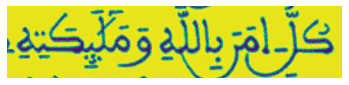

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


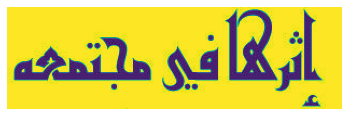

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 3


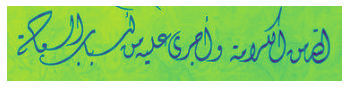

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


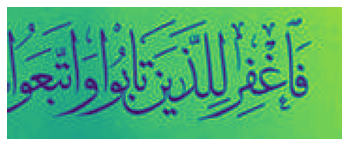

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


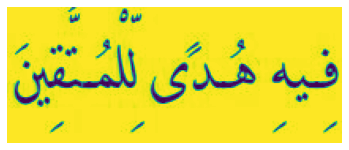

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


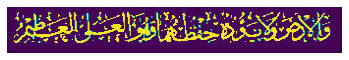

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


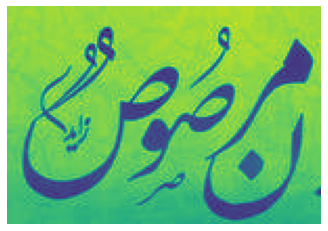

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 9


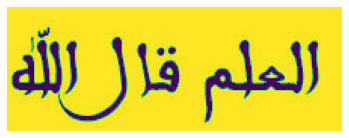

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 2


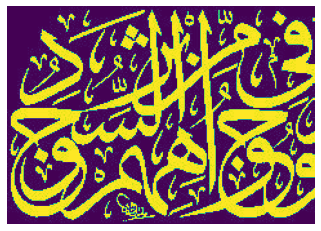

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


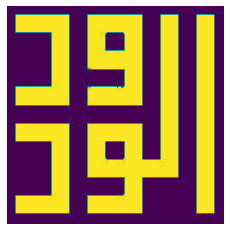

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


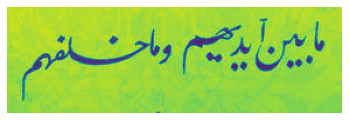

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 7


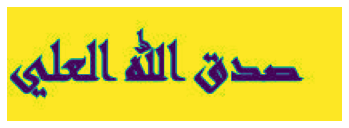

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


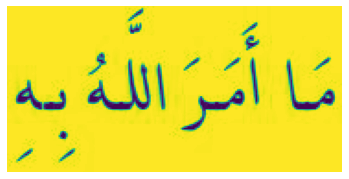

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


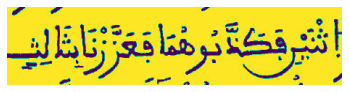

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


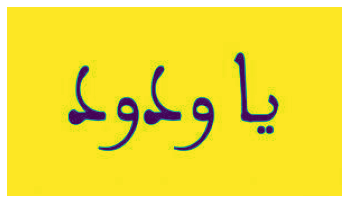

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 6


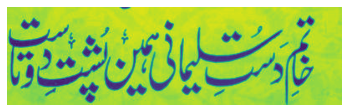

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


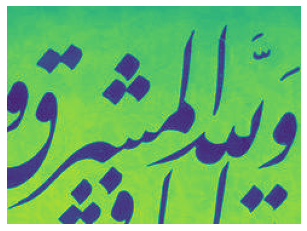

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


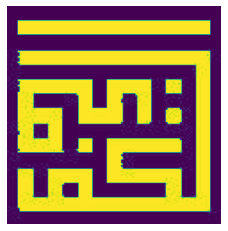

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


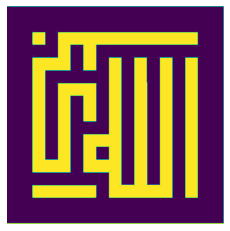

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


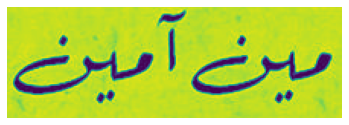

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 2


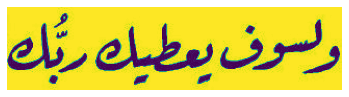

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 7


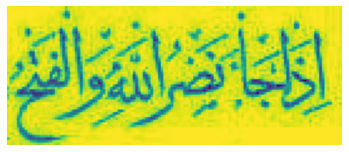

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


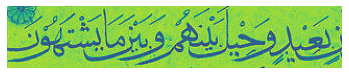

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 7


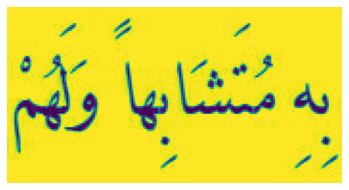

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


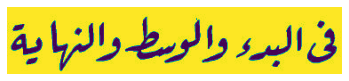

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 6


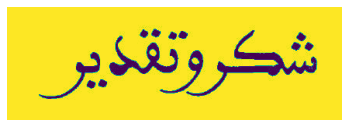

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


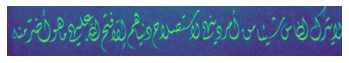

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 5


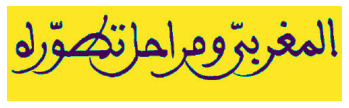

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


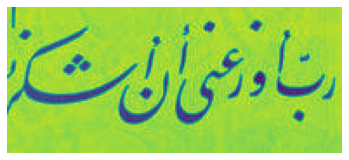

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 8


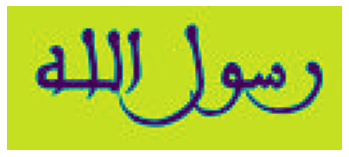

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 5


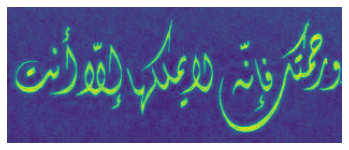

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 5


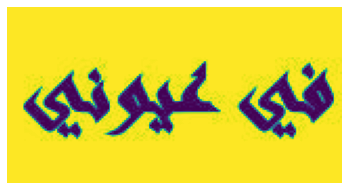

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 9


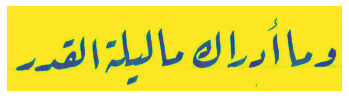

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 1


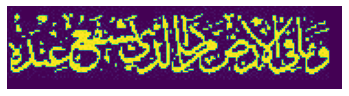

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


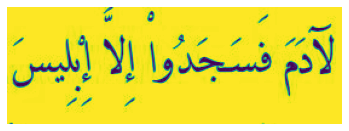

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 3


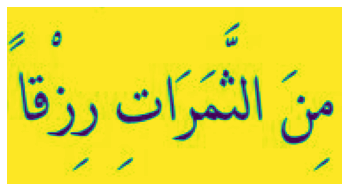

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


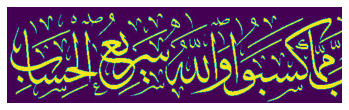

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


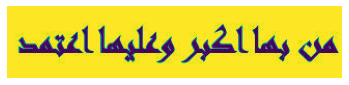

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 7


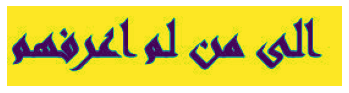

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 3


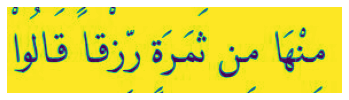

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 7


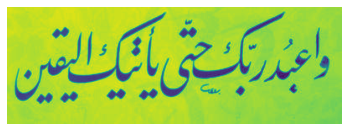

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


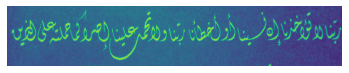

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


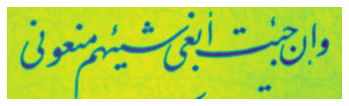

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 6


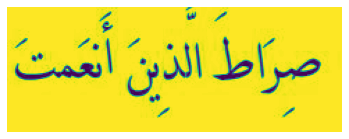

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 3


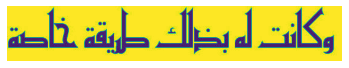

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 1


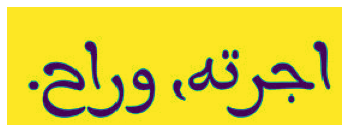

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 3


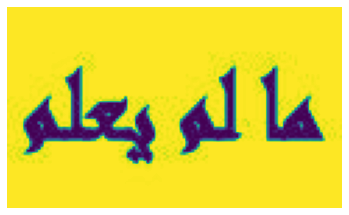

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 5


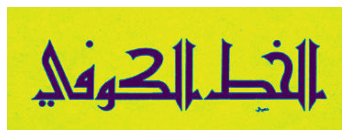

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 6


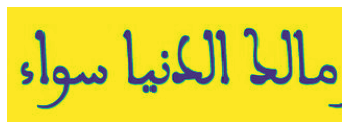

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 4


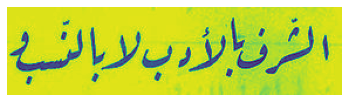

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 7


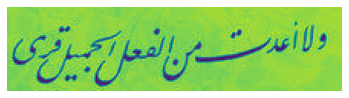

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 8


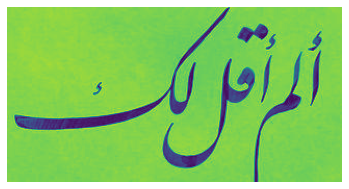

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 6


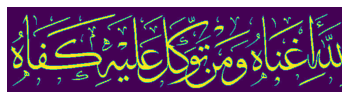

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


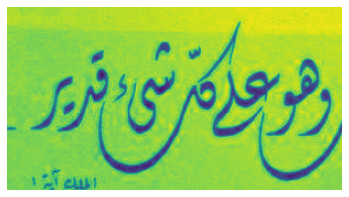

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 4


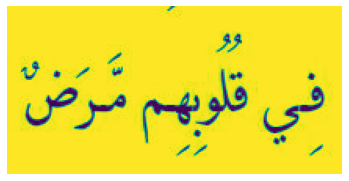

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


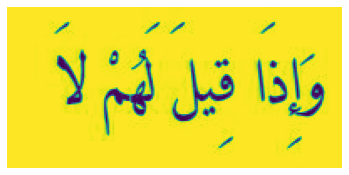

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


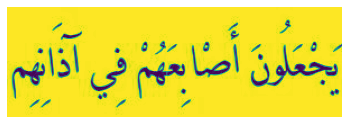

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 4


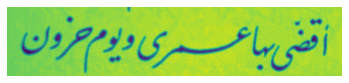

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


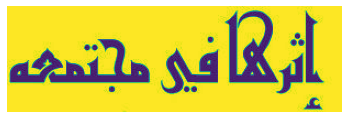

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 3


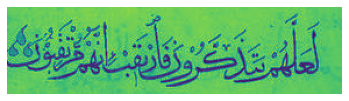

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 3


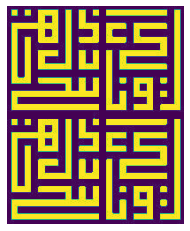

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


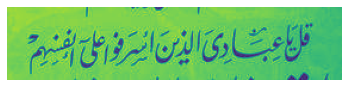

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 7


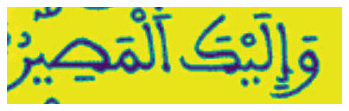

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


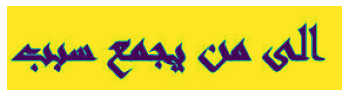

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 3


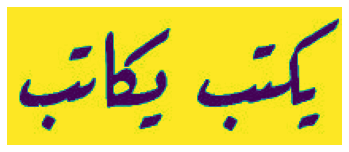

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 2


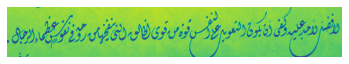

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


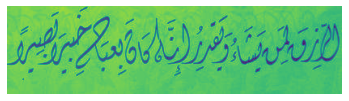

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 7


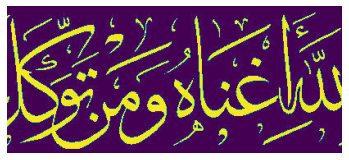

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


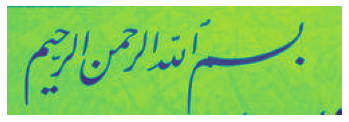

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 3


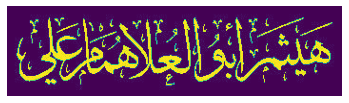

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


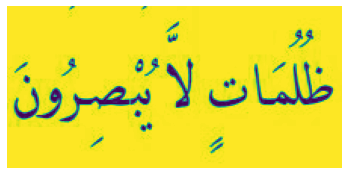

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


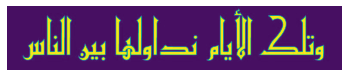

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 5


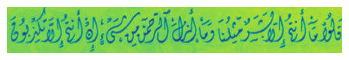

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


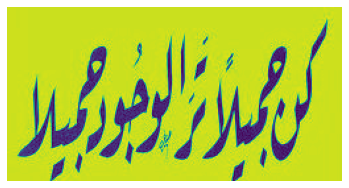

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


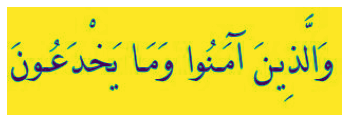

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 6


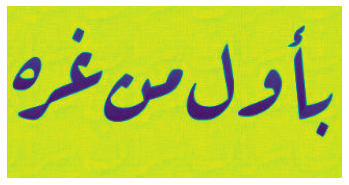

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 6


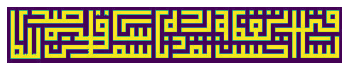

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 8


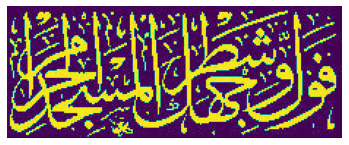

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


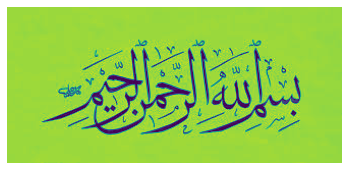

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 6


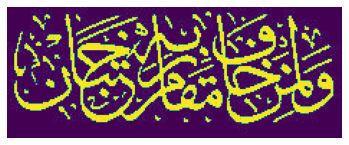

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


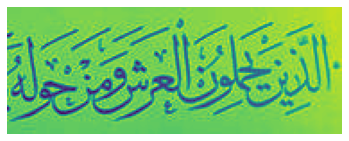

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


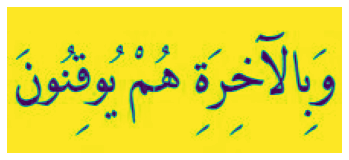

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


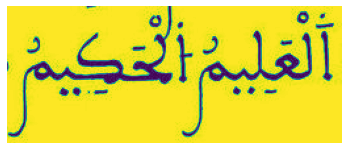

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 3


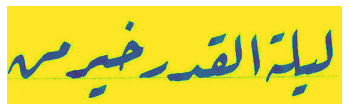

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 1


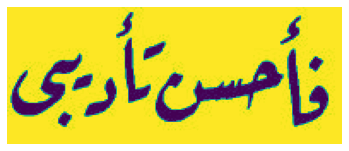

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 8


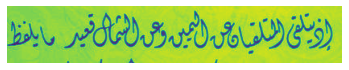

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


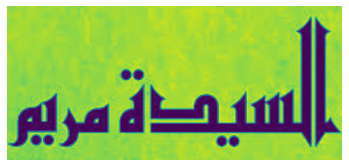

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 1


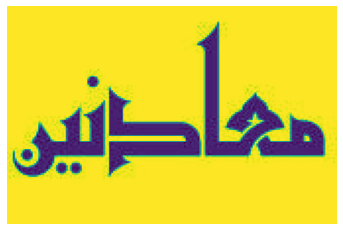

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 9


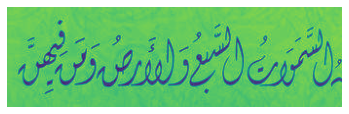

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


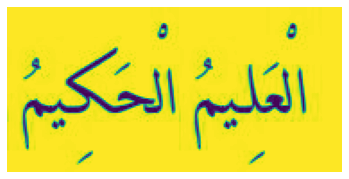

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


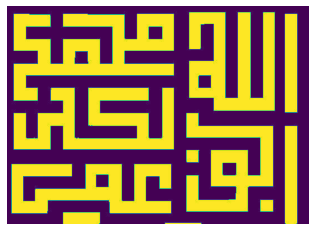

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 3


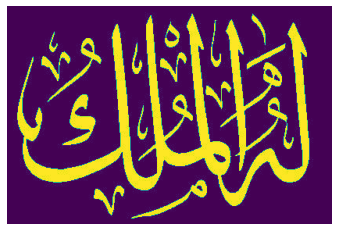

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


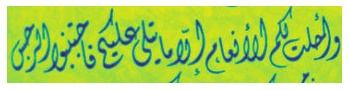

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


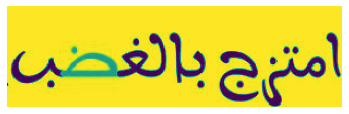

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 7


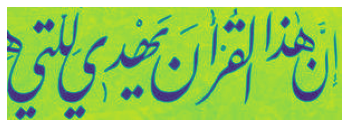

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 3


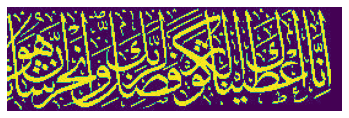

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


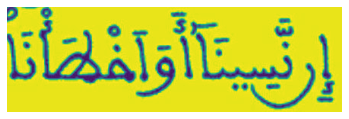

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 1


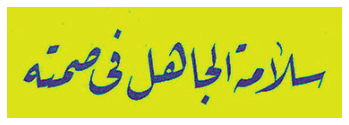

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 1


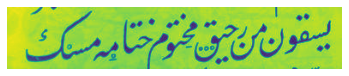

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


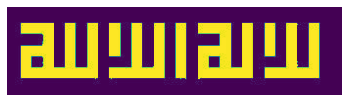

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


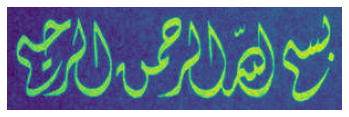

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 5


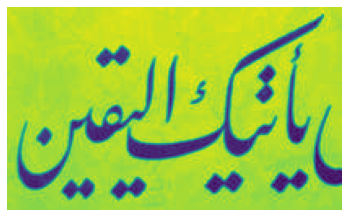

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


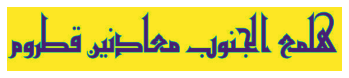

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 1


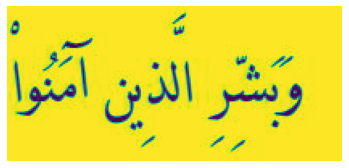

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


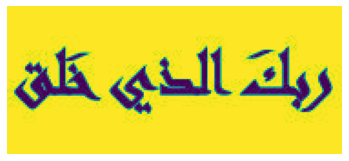

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


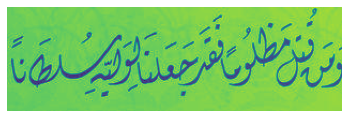

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 4


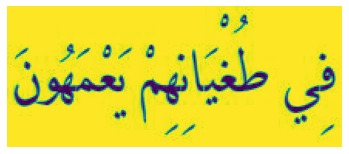

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


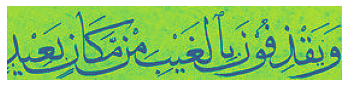

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 3


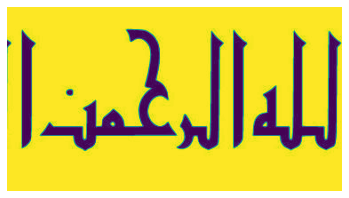

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 6


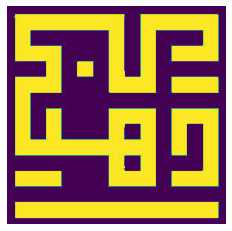

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


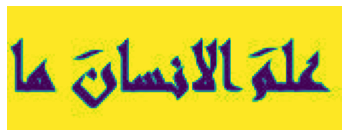

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


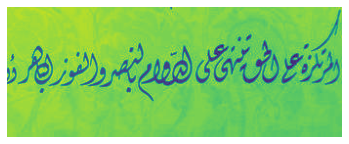

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


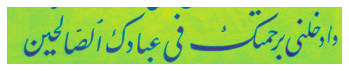

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


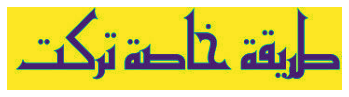

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 7


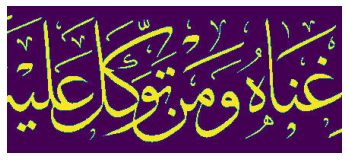

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


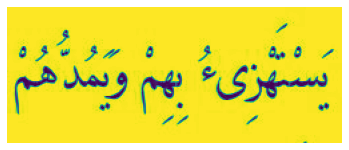

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 3


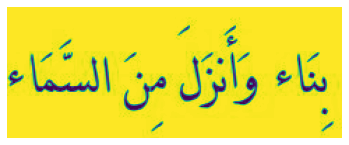

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 3


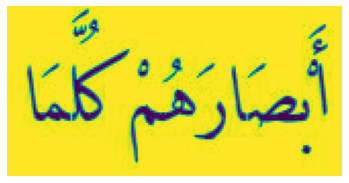

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


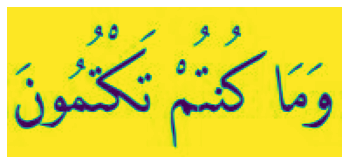

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


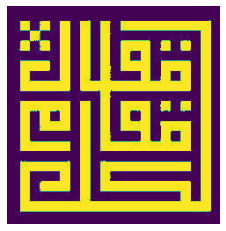

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


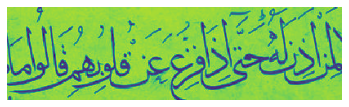

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 1


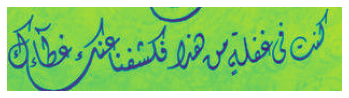

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 7


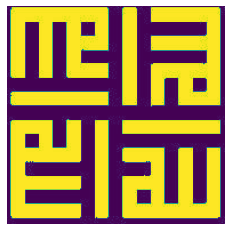

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


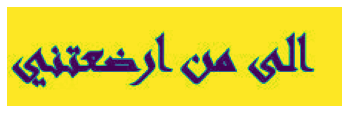

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


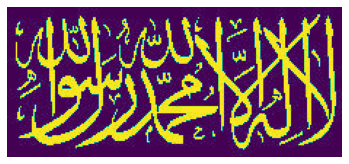

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


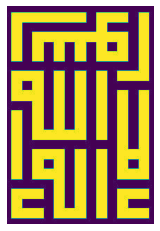

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


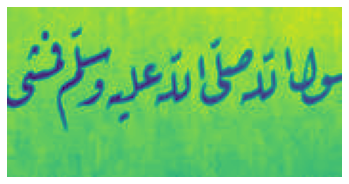

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 5


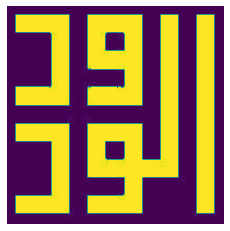

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


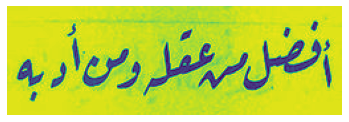

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 3


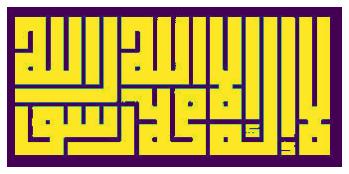

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 2


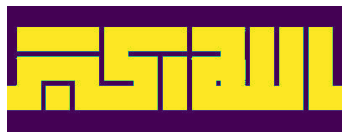

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 2


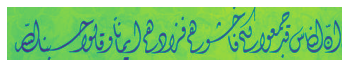

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


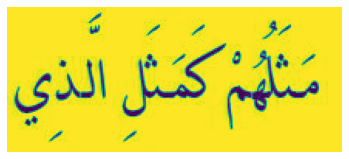

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


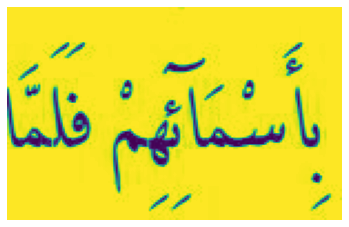

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


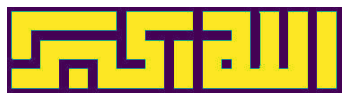

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 3


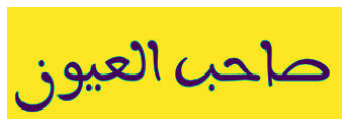

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 6


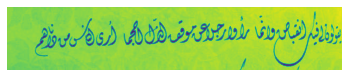

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


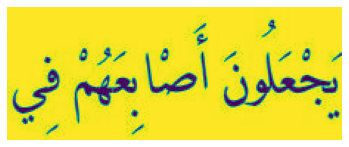

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


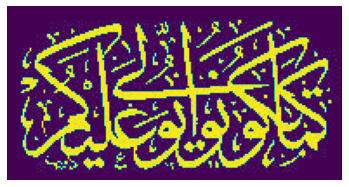

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


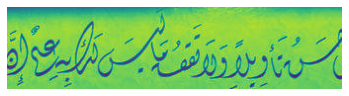

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


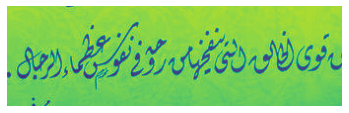

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


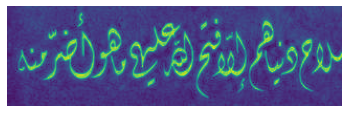

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 5


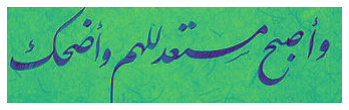

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 3


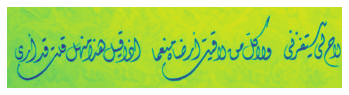

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


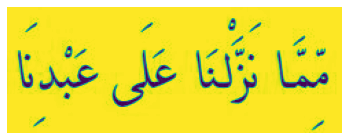

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 3


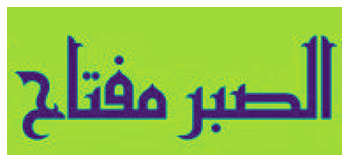

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


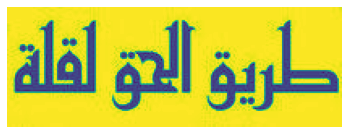

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


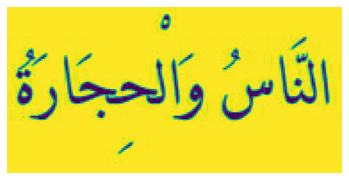

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


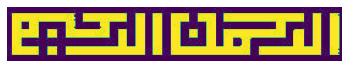

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


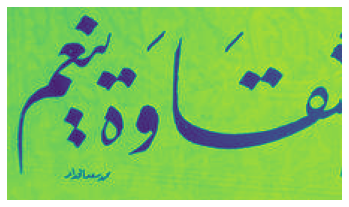

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


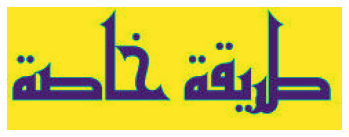

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 2


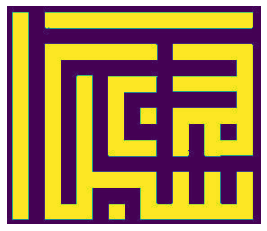

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


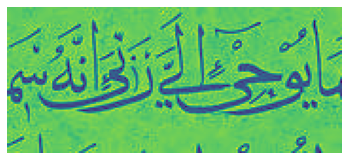

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 9


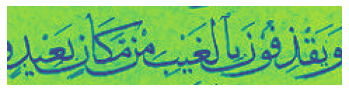

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 8


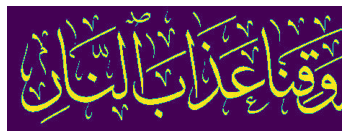

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


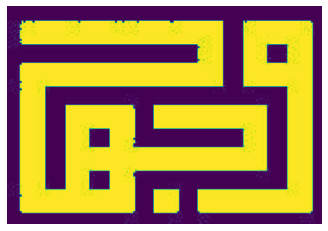

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 5


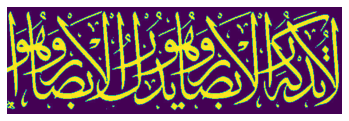

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 2


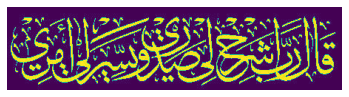

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


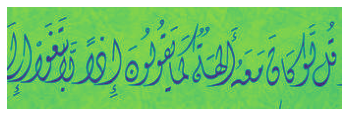

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


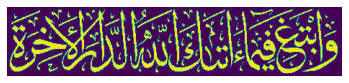

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


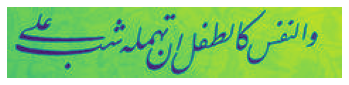

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 8


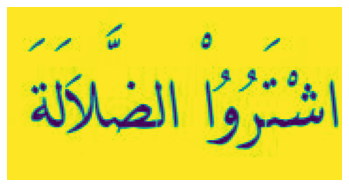

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


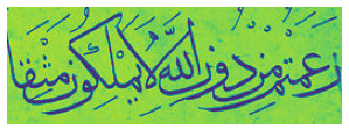

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 3


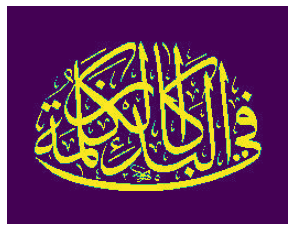

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


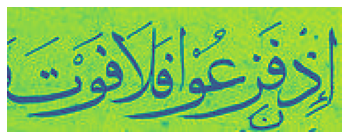

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 8


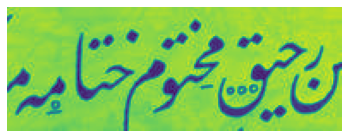

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 8


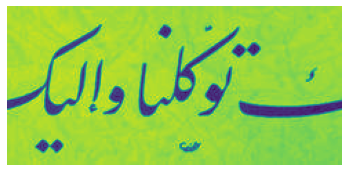

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


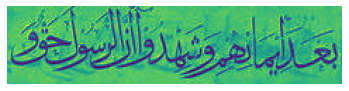

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


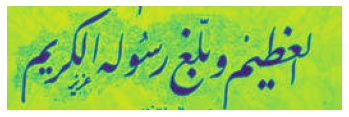

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 3


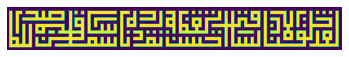

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 7


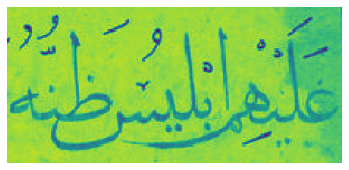

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 2


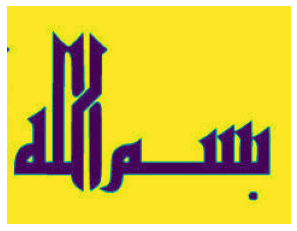

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 2


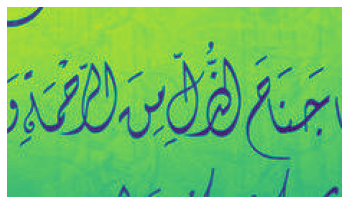

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 2


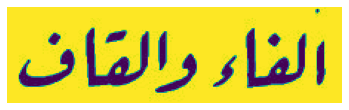

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 8


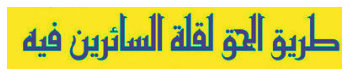

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 6


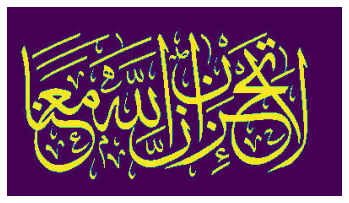

Actual class : 5
---------------------------------------
Minimum Distance Classifier Prediction   : 5


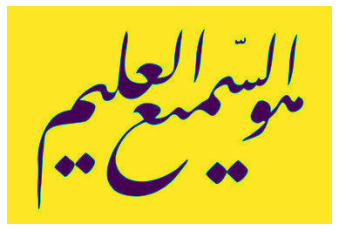

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


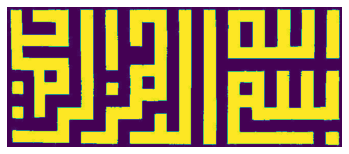

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 1


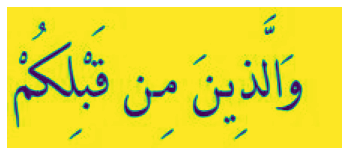

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


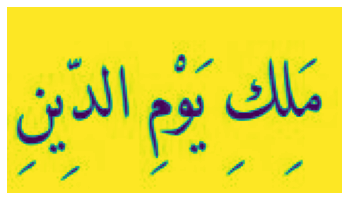

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 9


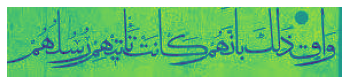

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 3


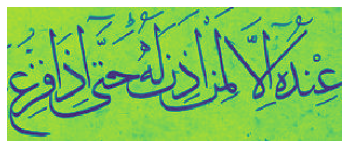

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 4


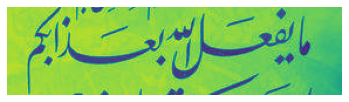

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 3


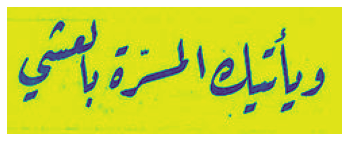

Actual class : 4
---------------------------------------
Minimum Distance Classifier Prediction   : 2


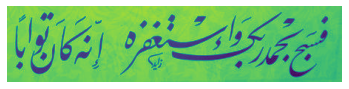

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


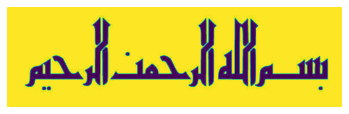

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 1


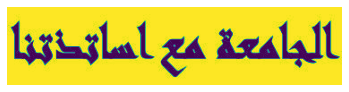

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 6


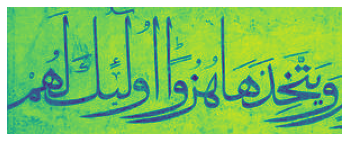

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 3


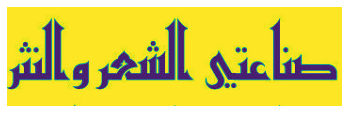

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 4


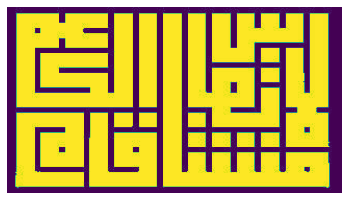

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 2


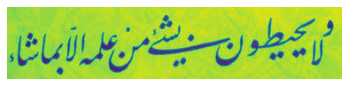

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 1


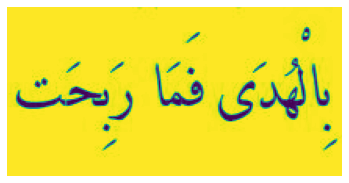

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


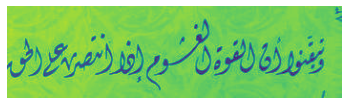

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 6


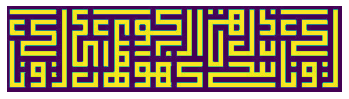

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 8


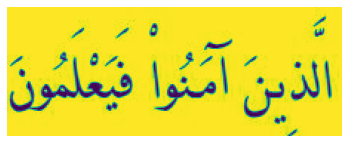

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


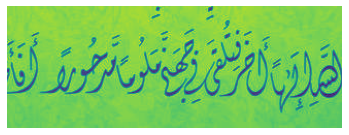

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 4


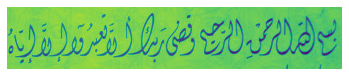

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


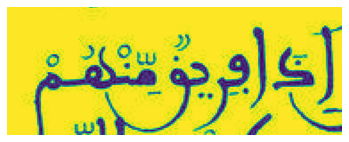

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 8


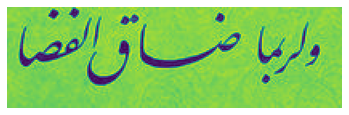

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 8


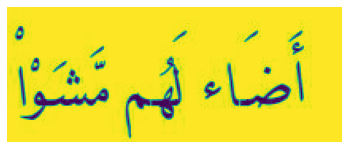

Actual class : 2
---------------------------------------
Minimum Distance Classifier Prediction   : 2


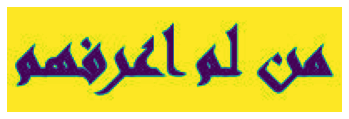

Actual class : 7
---------------------------------------
Minimum Distance Classifier Prediction   : 8


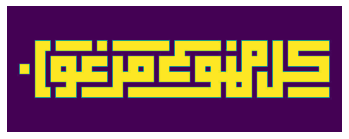

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 3


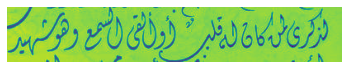

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1


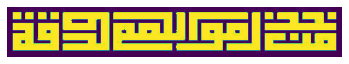

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 7


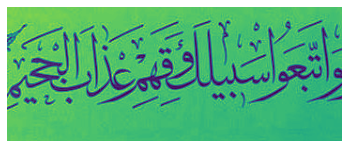

Actual class : 8
---------------------------------------
Minimum Distance Classifier Prediction   : 5


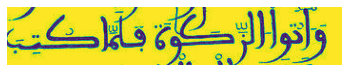

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 7


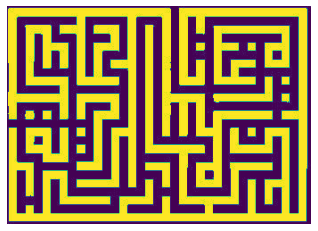

Actual class : 9
---------------------------------------
Minimum Distance Classifier Prediction   : 9


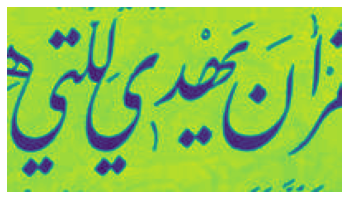

Actual class : 3
---------------------------------------
Minimum Distance Classifier Prediction   : 2


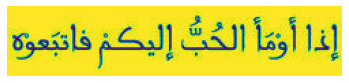

Actual class : 6
---------------------------------------
Minimum Distance Classifier Prediction   : 8


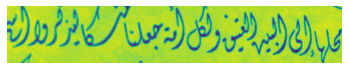

Actual class : 1
---------------------------------------
Minimum Distance Classifier Prediction   : 1
22
Minimum Distance Classifier Accuracy:  6.528189910979229 %


In [34]:
minDistPredictions = list()
classes = ['1', '2', '3', '4', '5', '6', '7', '8', '9']
for i in range(len(xTest)):
    testPoint = featuresExtraction(xTest[i])
    fig = plt.figure()
    plt.imshow(xTest[i])
    plt.axis("off")
    plt.show()
    print("Actual class :", yTest[i])
    print("---------------------------------------")
    minDistPrediction = MinimumDistanceClassifier(testPoint, trainingFeatures, yTrain)
    minDistPredictions.append(minDistPrediction)
    print("Minimum Distance Classifier Prediction   :", classes[minDistPrediction])
    print("===========================================================================")
print(np.sum(minDistPredictions == yTest))
mdcAccuracy = (np.sum(minDistPredictions == yTest) / len(yTest)) * 100
print("Minimum Distance Classifier Accuracy: ", mdcAccuracy, "%")

In [62]:
energy = []
homogeneity = []
correlation = []
diss = []
for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/2/*.jpg')):
    img = cv2.imread(filename)
    img = np.asarray(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img = cv2.resize(img, (128, 128))
    #img[img < 150] = 0
    #img[img >= 150] = 1
    #show_images([img])
    glcm = greycomatrix(img, [1], [0])
    energy.append(greycoprops(glcm, prop='energy'))
    homogeneity.append(greycoprops(glcm, prop='homogeneity'))
    correlation.append(greycoprops(glcm, prop='correlation'))
    diss.append(greycoprops(glcm, prop='dissimilarity'))
print("Energy:", min(energy), max(energy))
print("Homogeneity:", min(homogeneity), max(homogeneity))
print("Correlation:", min(correlation), max(correlation))
print("Diss:", min(diss), max(diss))

Energy: [[0.31859009]] [[0.62148469]]
Homogeneity: [[0.5054618]] [[0.72379877]]
Correlation: [[0.51347225]] [[0.87531594]]
Diss: [[7.97041093]] [[19.36478839]]


In [63]:
energy = []
homogeneity = []
correlation = []
diss = []
for filename in sorted(glob.glob('C:/Users/Mazen/Desktop/pattern/Project/ACdata_base/3/*.jpg')):
    img = cv2.imread(filename)
    img = np.asarray(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img = cv2.resize(img, (128, 128))
    #img[img < 150] = 0
    #img[img >= 150] = 1
    #show_images([img])
    glcm = greycomatrix(img, [1], [0])
    energy.append(greycoprops(glcm, prop='energy'))
    homogeneity.append(greycoprops(glcm, prop='homogeneity'))
    correlation.append(greycoprops(glcm, prop='correlation'))
    diss.append(greycoprops(glcm, prop='dissimilarity'))
print("Energy:", min(energy), max(energy))
print("Homogeneity:", min(homogeneity), max(homogeneity))
print("Correlation:", min(correlation), max(correlation))
print("Diss:", min(diss), max(diss))

Energy: [[0.03077559]] [[0.73677761]]
Homogeneity: [[0.15862607]] [[0.79527385]]
Correlation: [[0.39458763]] [[0.88644093]]
Diss: [[6.55401083]] [[23.75596703]]
